In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scipy.io as io

sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

# set random seed for reproducibility:
np.random.seed(42)


In [2]:
# set working dir 
os.chdir('/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Absinta_2021')

fig_dir = 'figures/'
data_dir = 'data/'


In [3]:
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()

## Load Absinta et al 2021 dataset

In [4]:
count_data_dir = '/dfs3b/swaruplab/shared_lab/cross-disorder/count_matrices/MS_Absinta_2021/'
samples = [s for s in os.listdir(count_data_dir)]

adata_list = []
for sample in samples:
    try:
        adata = sc.read_h5ad('{}{}/scanpy_preprocessing_cellbender/data/adata_unfiltered.h5ad'.format(count_data_dir, sample))
    except:
        print('sample', sample, ' error')
        continue
    adata.obs['Sample'] = sample
    adata.obs['Study'] = 'Absinta_2021'
    adata.obs['orig_barcode'] = adata.obs.index
    
    adata_list.append(adata)
    
    print(sample, adata.shape)


SRR15235939 (17937, 36601)
SRR15235929 (6134, 36601)
SRR15235930 (9399, 36601)
SRR15235931 (2028, 36601)
SRR15235938 (8692, 36601)
SRR15235940 (7327, 36601)
SRR15235935 (2594, 36601)
SRR15235928 (3052, 36601)
SRR15235937 (8161, 36601)
SRR15235934 (4468, 36601)
SRR15235932 (4059, 36601)
SRR15235936 (20894, 36601)
SRR15235941 (2899, 36601)
SRR15235933 (3266, 36601)
s17 (9849, 36601)
s18 (29519, 36601)
s19 (15834, 36601)
s20 (10917, 36601)
s22 (11570, 36601)
s23 (20000, 36601)
sample Absinta_2021_unprocessed.h5ad  error
sample Absinta_2021_unfiltered.h5ad  error


In [5]:
# concatenate
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index

# filter small cells
sc.pp.filter_cells(adata, min_counts = 250)

# add counts layer
adata.layers["counts"] = adata.X.copy()

# print shape of dataset
adata.shape


(176093, 36601)

* loop over each sample 
* find the sample from GEO data with most overlapping barcodes, that is the matching sample 
* make sure the matching sample isn't already taken

In [6]:
# cell meta-data from GEO 
cell_meta = pd.read_csv(
    '/dfs3b/swaruplab/shared_lab/cross-disorder/meta_data/MS_Absinta/GSE180759_annotation.txt',
    sep='\t'
)

# fix one sample's name to match the other tables
cell_meta['NBB_case'] = cell_meta.NBB_case.replace(to_replace="11_69", value="11_069")

cell_meta['orig_barcode'] = cell_meta.nucleus_barcode.str.split('-', expand=True)[0]
cell_meta['batch'] = cell_meta.nucleus_barcode.str.split('-', expand=True)[1]
cell_meta['Sample'] = cell_meta.batch.astype(str) +  '-' + cell_meta.NBB_case.astype(str) + '-' + cell_meta.pathology.astype(str)


In [7]:
adata.obs['corrected_barcode'] = adata.obs.orig_barcode.astype(str) + '-' + adata.obs.batch.astype(str)

match_list = []
for geo_sample in cell_meta.Sample.unique():
    print(geo_sample)
    cur_geo_df = cell_meta[cell_meta.Sample == geo_sample]
    
    pct_overlap = []
    for cur_sample in adata.obs.Sample.unique():
        cur_df = adata.obs[adata.obs.Sample == cur_sample]

        pct_overlap.append(sum(cur_geo_df.orig_barcode.isin(cur_df.orig_barcode)) / cur_geo_df.shape[0])

    max_ind = pct_overlap.index(max(pct_overlap))
    sample_match = adata.obs.Sample.unique()[max_ind]
    match_list.append(sample_match)
    
    print(max(pct_overlap))
    print(sample_match)
    print()

1-13_047-chronic_active_MS_lesion_edge
0.8825320861431368
SRR15235929

3-13_047-chronic_active_MS_lesion_edge
1.0
SRR15235936

6-13_047-chronic_active_MS_lesion_edge
0.9904359430604982
SRR15235940

9-13_047-chronic_inactive_MS_lesion_edge
0.9340866290018832
SRR15235932

16-13_047-MS_lesion_core
1.0
s18

2-09_034-chronic_active_MS_lesion_edge
0.8564220183486239
SRR15235933

11-09_034-chronic_inactive_MS_lesion_edge
1.0
SRR15235937

17-09_034-MS_periplaque_white_matter
1.0
s19

4-12_078-chronic_active_MS_lesion_edge
1.0
SRR15235938

12-12_078-chronic_inactive_MS_lesion_edge
1.0
SRR15235941

20-12_078-MS_periplaque_white_matter
1.0
s23

5-09_067-chronic_active_MS_lesion_edge
1.0
SRR15235939

7-09_067-MS_lesion_core
0.7789017341040463
SRR15235928

18-09_067-MS_periplaque_white_matter
1.0
s20

8-13_015-chronic_inactive_MS_lesion_edge
0.43658536585365854
SRR15235930

10-13_015-chronic_inactive_MS_lesion_edge
0.8705793829947329
SRR15235934

19-13_015-MS_periplaque_white_matter
1.0
s22

13-12_

In [8]:
# make dataframe mapping between sample & match
match_df = pd.DataFrame()
match_df['geo_sample'] = cell_meta.Sample.unique()
match_df['match'] = match_list
match_df


# merge with anndata:
adata.obs['geo_sample'] = adata.obs.merge(
    match_df, how='left',
    left_on = "Sample", right_on = 'match'
)['geo_sample'].tolist()

In [9]:
# add Netherlands BioBank ID to adata obs 
temp = adata.obs.geo_sample.str.split('-', expand=True)
adata.obs['nbb_num'] = temp[1]
adata.obs['tissue_sample'] = temp[2]

In [10]:
# load sample meta
sample_meta = pd.read_csv(
    '/dfs3b/swaruplab/shared_lab/cross-disorder/meta_data/MS_Absinta/absinta_sample_meta.csv',
)
sample_meta.nbb_num

0    09_034
1    12_078
2    09_067
3    13_047
4    13_015
5    14_043
6    11_069
7    12_002
Name: nbb_num, dtype: object

In [11]:
# merge sample data with adata obs table
temp = adata.obs.merge(
    sample_meta, how='left',
    on = 'nbb_num'
)
temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None

adata.obs['Sample'] = adata.obs['geo_sample']

In [12]:
cell_meta['Sample_barcode'] = cell_meta.orig_barcode.astype(str) + '-' + cell_meta.Sample.astype(str)
adata.obs['Sample_barcode'] = adata.obs.orig_barcode.astype(str) + '-' + adata.obs.Sample.astype(str)


cell_meta = cell_meta[['seurat_cluster', 'cell_type', 'Sample_barcode']]

# merge cell meta:
temp = adata.obs.merge(
    cell_meta, how='left',
    on = 'Sample_barcode'
)
temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None


In [13]:
# cleanup unnecessary columns
adata.obs = adata.obs.drop(['corrected_barcode','geo_sample'], axis=1)

In [14]:
# save unfiltered dataset:

adata.write_h5ad('{}Absinta_2021_unfiltered.h5ad'.format(data_dir))


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'doublets' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Sample' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inpla

## Filter cells 

In [15]:
# load unfiltered data 
adata = sc.read_h5ad('{}Absinta_2021_unfiltered.h5ad'.format(data_dir))

In [16]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=True, inplace=True)

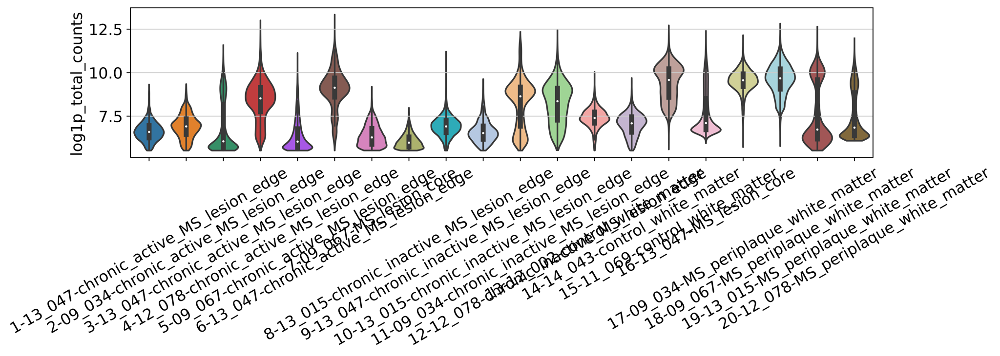

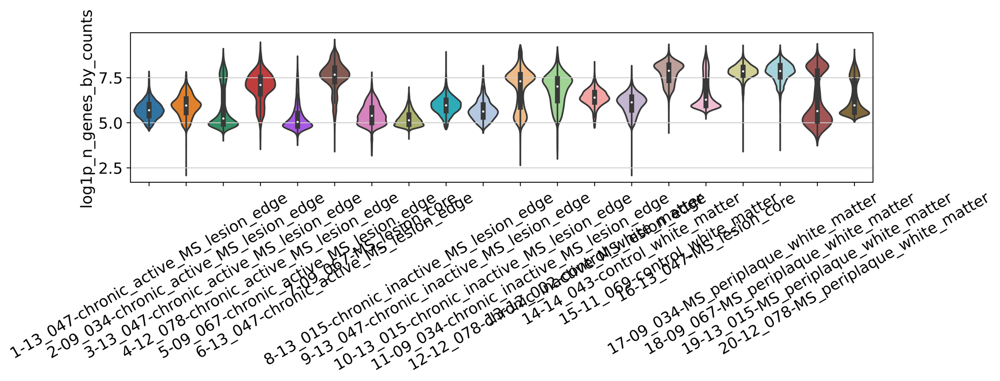

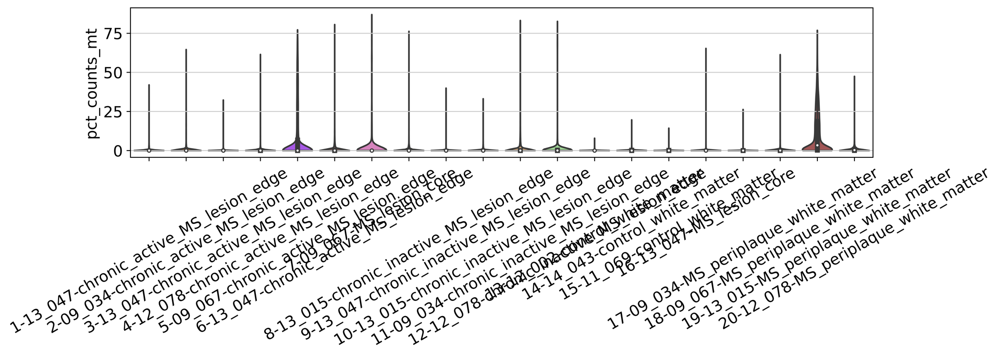

In [17]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'log1p_n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [18]:

mt_quantile = 0.975 
umi_quantile = 0.975
doublet_quantile = 0.975

samples = adata.obs.Sample.value_counts().index.to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Sample == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_scores.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_scores < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    

16-13_047-MS_lesion_core removed  2114 , kept  27405
20-12_078-MS_periplaque_white_matter removed  1504 , kept  18496
3-13_047-chronic_active_MS_lesion_edge removed  1250 , kept  15492
17-09_034-MS_periplaque_white_matter removed  1134 , kept  14692
19-13_015-MS_periplaque_white_matter removed  853 , kept  10235
18-09_067-MS_periplaque_white_matter removed  813 , kept  10101
15-11_069-control_white_matter removed  825 , kept  9018
5-09_067-chronic_active_MS_lesion_edge removed  675 , kept  8500
4-12_078-chronic_active_MS_lesion_edge removed  669 , kept  7972
11-09_034-chronic_inactive_MS_lesion_edge removed  618 , kept  7504
6-13_047-chronic_active_MS_lesion_edge removed  548 , kept  6776
1-13_047-chronic_active_MS_lesion_edge removed  365 , kept  4648
8-13_015-chronic_inactive_MS_lesion_edge removed  324 , kept  4013
10-13_015-chronic_inactive_MS_lesion_edge removed  327 , kept  3793
9-13_047-chronic_inactive_MS_lesion_edge removed  260 , kept  3616
12-12_078-chronic_inactive_MS_lesio

In [19]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)]
adata.shape

(162964, 36601)

In [20]:
adata = adata[adata.obs.n_genes_by_counts >= 250]
adata = adata[adata.obs.pct_counts_mt <= 10]

adata.shape

(125698, 36601)

## Process data for Harmony

In [21]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [22]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)


In [23]:
sc.tl.pca(adata, svd_solver='arpack')

In [24]:
sc.external.pp.harmony_integrate(adata, key = 'Sample')

2021-11-30 16:08:31,032 - harmonypy - INFO - Iteration 1 of 10
2021-11-30 16:09:25,307 - harmonypy - INFO - Iteration 2 of 10
2021-11-30 16:10:21,048 - harmonypy - INFO - Iteration 3 of 10
2021-11-30 16:11:15,293 - harmonypy - INFO - Iteration 4 of 10
2021-11-30 16:12:08,900 - harmonypy - INFO - Iteration 5 of 10
2021-11-30 16:13:01,657 - harmonypy - INFO - Converged after 5 iterations


In [25]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

In [26]:
sc.tl.umap(adata, min_dist=0.4, method='umap')

In [27]:
sc.tl.leiden(adata, resolution=1.5)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

In [28]:
# how many cells in each cluster?
adata.obs.leiden.value_counts()

0     11400
1     11387
2      9674
3      8999
4      8244
5      6954
6      6519
7      5105
8      5100
9      4912
10     4755
11     4721
12     3898
13     3737
14     3006
15     3000
16     2787
17     2635
18     2581
19     2467
20     2212
21     1843
22     1597
23     1329
24     1138
25      967
26      776
27      719
28      714
29      688
30      461
31      374
32      335
33      287
34      125
35      106
36       93
37       53
Name: leiden, dtype: int64

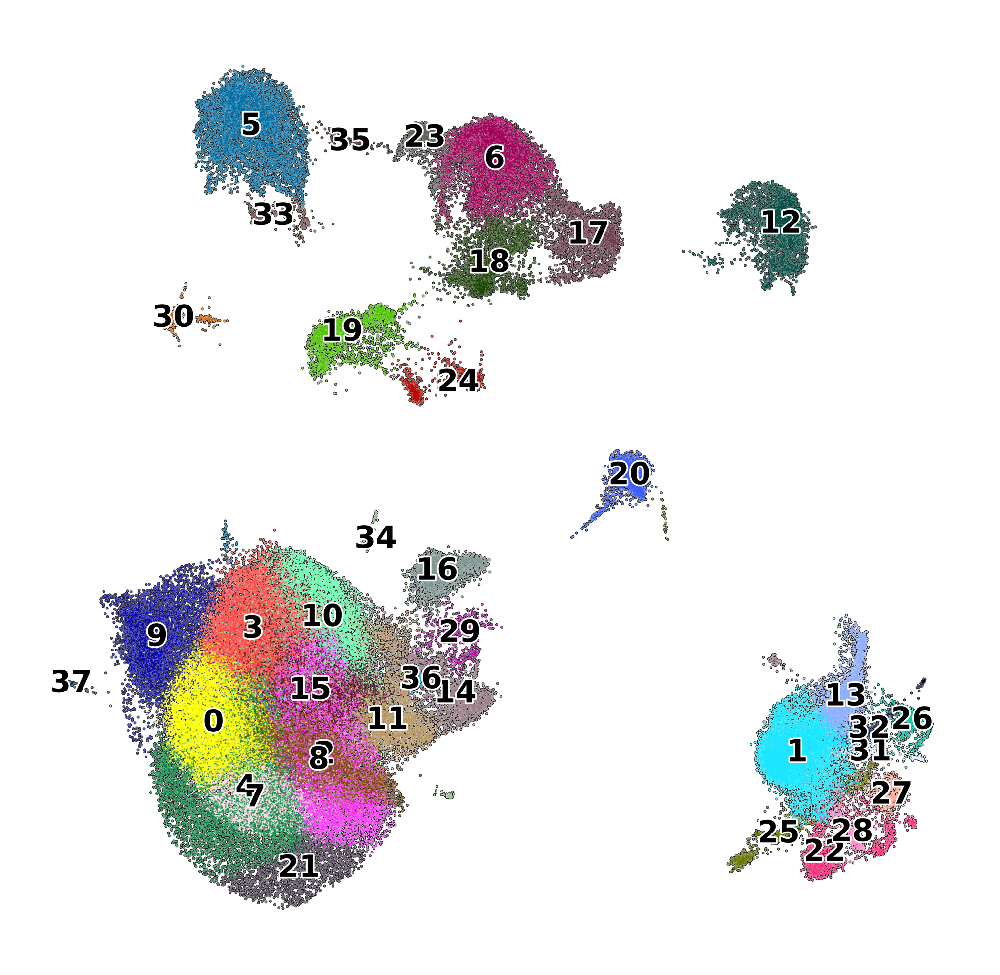

In [29]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(adata, color=['leiden'],frameon=False, legend_loc='on data', legend_fontoutline=1, legend_fontsize=9, add_outline=True, title='', save='_leiden.pdf')


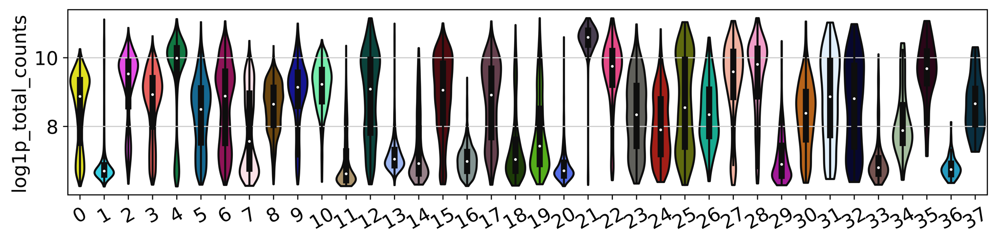

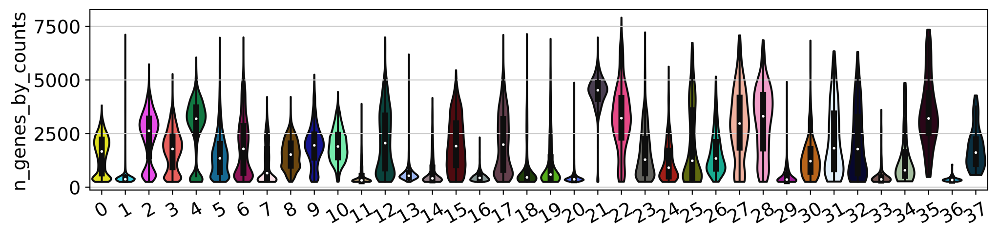

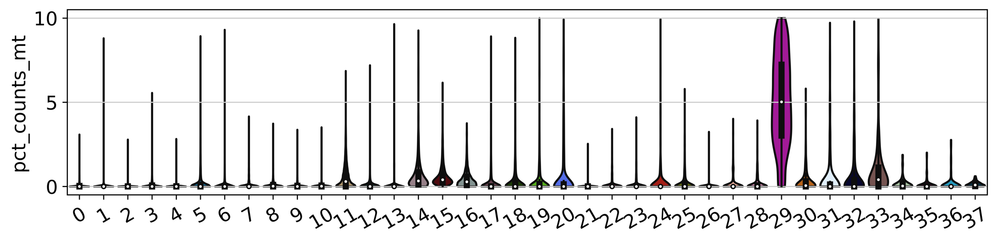

In [30]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)

In [31]:
adata.obs.columns

Index(['n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study',
       'orig_barcode', 'batch', 'barcode', 'nbb_num', 'tissue_sample', 'sex',
       'age', 'diagnosis', 'years_disease', 'treatment', 'pmi_hours',
       'Sample_barcode', 'seurat_cluster', 'cell_type', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden'],
      dtype='object')

/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'seurat_cluster' as categorical


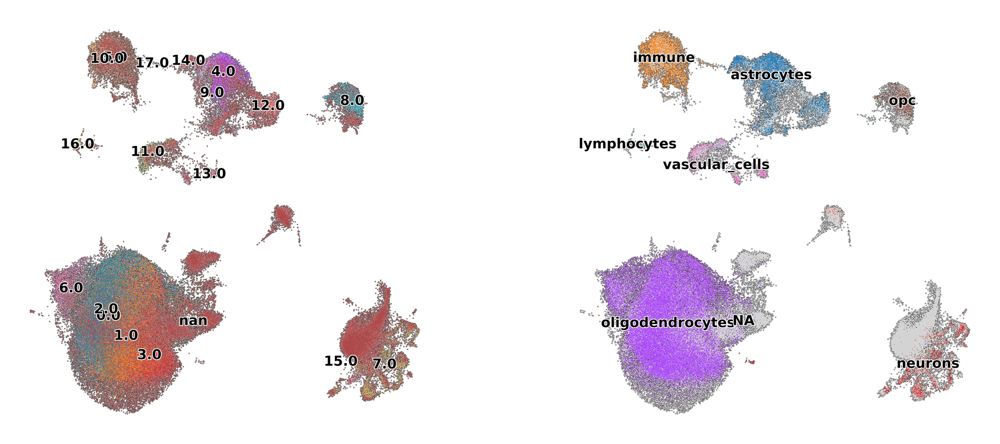

In [32]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')


adata.obs.seurat_cluster = adata.obs.seurat_cluster.astype('str')
sc.pl.umap(adata, color=['seurat_cluster', 'cell_type'],frameon=False, legend_loc='on data', legend_fontoutline=1, legend_fontsize=9, add_outline=True, title=['', ''], save='_orig_clusters.pdf')


In [ ]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')


adata.obs.seurat_cluster = adata.obs.seurat_cluster.astype('str')
sc.pl.umap(
    adata, 
    color=['Sample'],
    title=[''],
    frameon=False,
    legend_fontoutline=1, legend_fontsize=9, 
    add_outline=True,
    save='_orig_clusters.pdf'
)


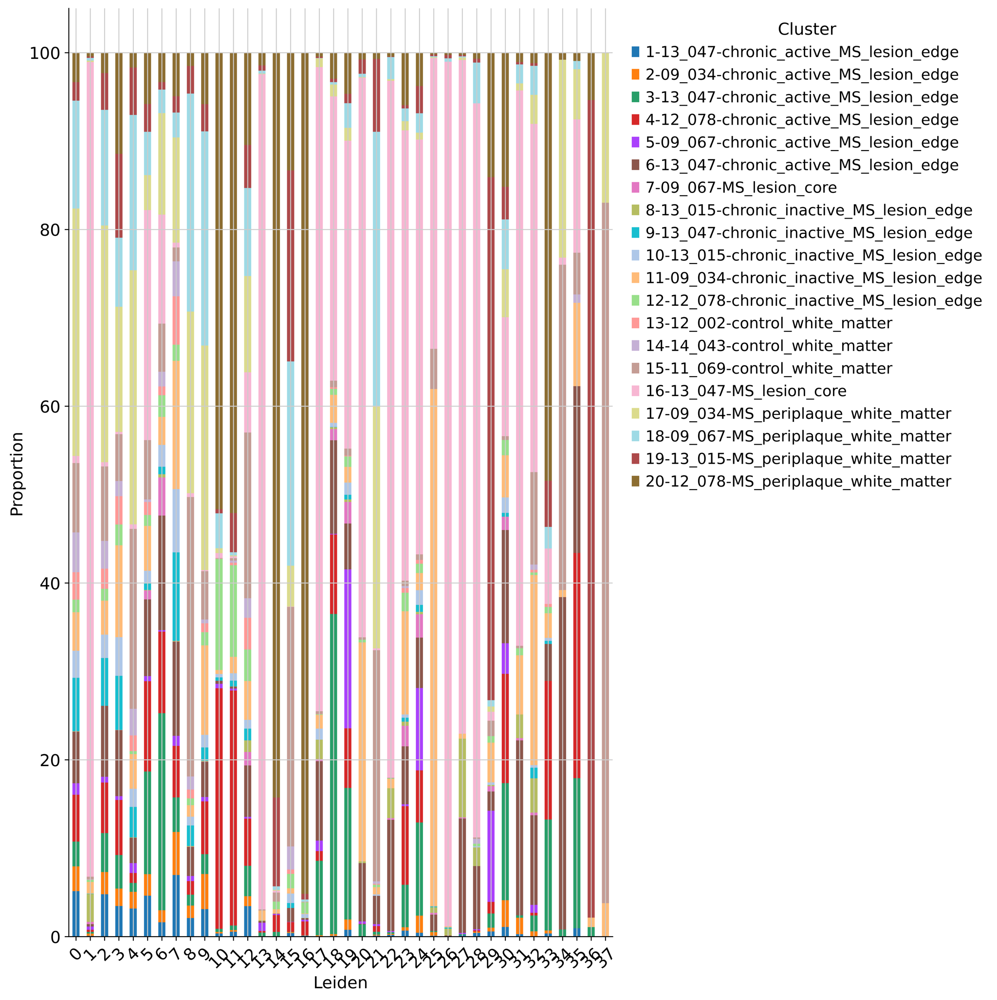

In [35]:
sc.settings.set_figure_params(dpi=300, figsize=(12,12), facecolor='white')
props = get_cluster_proportions(adata, cluster_key='Sample', sample_key='leiden')
plot_cluster_proportions(props, xlabel_rotation=45)

In [99]:
print(adata.obs[adata.obs.leiden == '12'].cell_type.value_counts())
print(adata.obs[adata.obs.leiden == '12'].shape)

oligodendrocytes    48
astrocytes           0
immune               0
lymphocytes          0
neurons              0
opc                  0
vascular_cells       0
Name: cell_type, dtype: int64
(2741, 27)


In [33]:
# marker genes from dotplot:
marker_dict = {
    'ODC' : ['PLP1', 'MOBP', 'MOG'],
    'OPC' : ['PDGFRA', 'OLIG1'],
    'Neuron' : ['STMN2', 'SNAP25'],
    'EX': ['SLC17A7'],
    'INH': ['PVALB', 'SST', 'LAMP5', 'VIP', 'GAD1', 'GAD2'],
    'Microglia': ['CX3CR1', 'CSF1R', 'PTPRC'],
    'Ependyma':['FOXJ1', 'FAM216B'],
    'Astrocyte' : ['AQP4', 'GFAP'],
    'Mural' : ['CLDN5'],
    'Endothelial': ['FLT1'],
    'Pericyte': ['PDGFRB'],
    'VLMC': ['VTN']
}

categories: 0, 1, 2, etc.
var_group_labels: ODC, OPC, Neuron, etc.


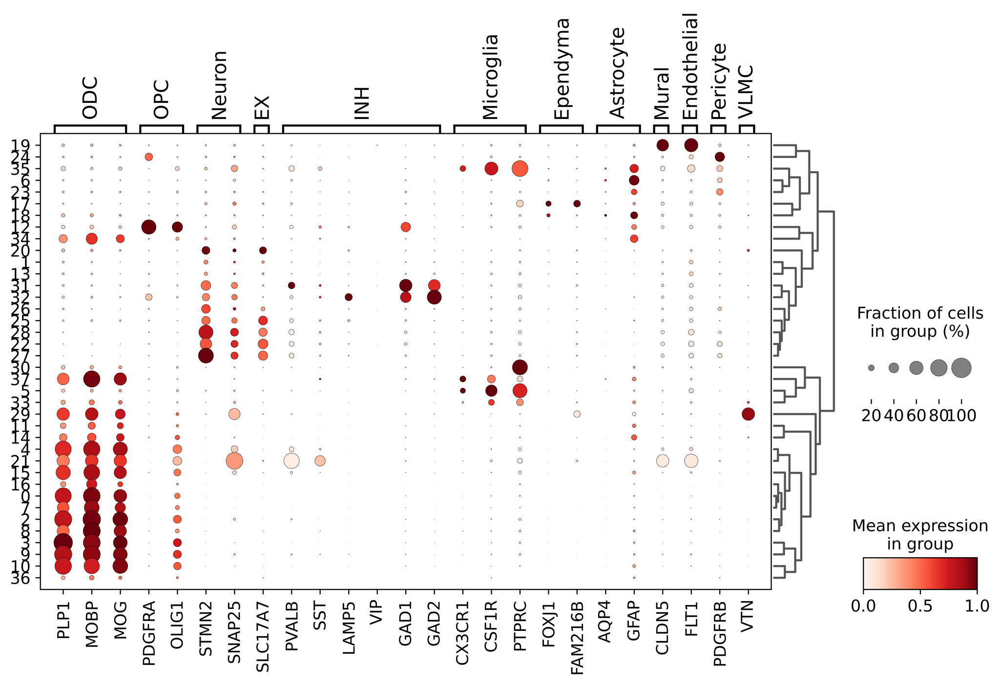

In [34]:
sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var', dendrogram=True, save='markers.pdf')


## filter low-quality clusters and re-cluster

In [37]:
clusters_to_remove = [
    '35', # micro / astro doublet 
    '34', # oligo / astro doublet 
    '1',  # potential neuron, very low genes
    '13', # potential neuron, very low genes
    '37', # oligo / micro doublet 
    '33', # oligo / micro doublet
    '29', # high mts, oligo / neuron doublet 
    '11', # low genes, oligo / astro doublet
    '14', # low genes, oligo / astro doublet
    '21', # oligo / neuro doublet 
    '16', # very low genes, all from one sample 
    '36', # very low genes
]

In [38]:
# remove bad clusters:
# adata = adata[~adata.obs.leiden.isin(clusters_to_remove)]
adata.shape

In [39]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')
sc.tl.umap(adata, min_dist=0.5, method='umap')

In [40]:
sc.tl.leiden(adata, resolution=1)
sc.tl.dendrogram(adata, 'leiden')

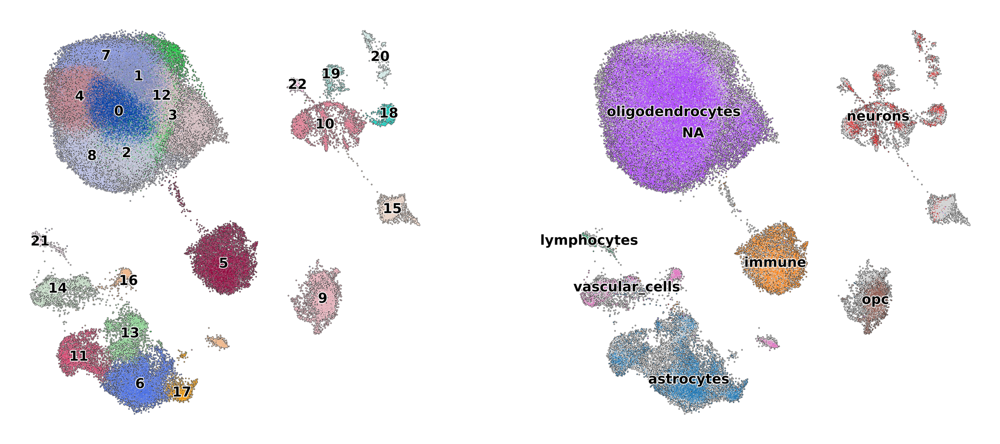

In [43]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(adata, color=['leiden', 'cell_type'],frameon=False, legend_loc='on data', legend_fontoutline=1, legend_fontsize=9, add_outline=True, title=['', ''], save='_leiden_filtered.pdf')


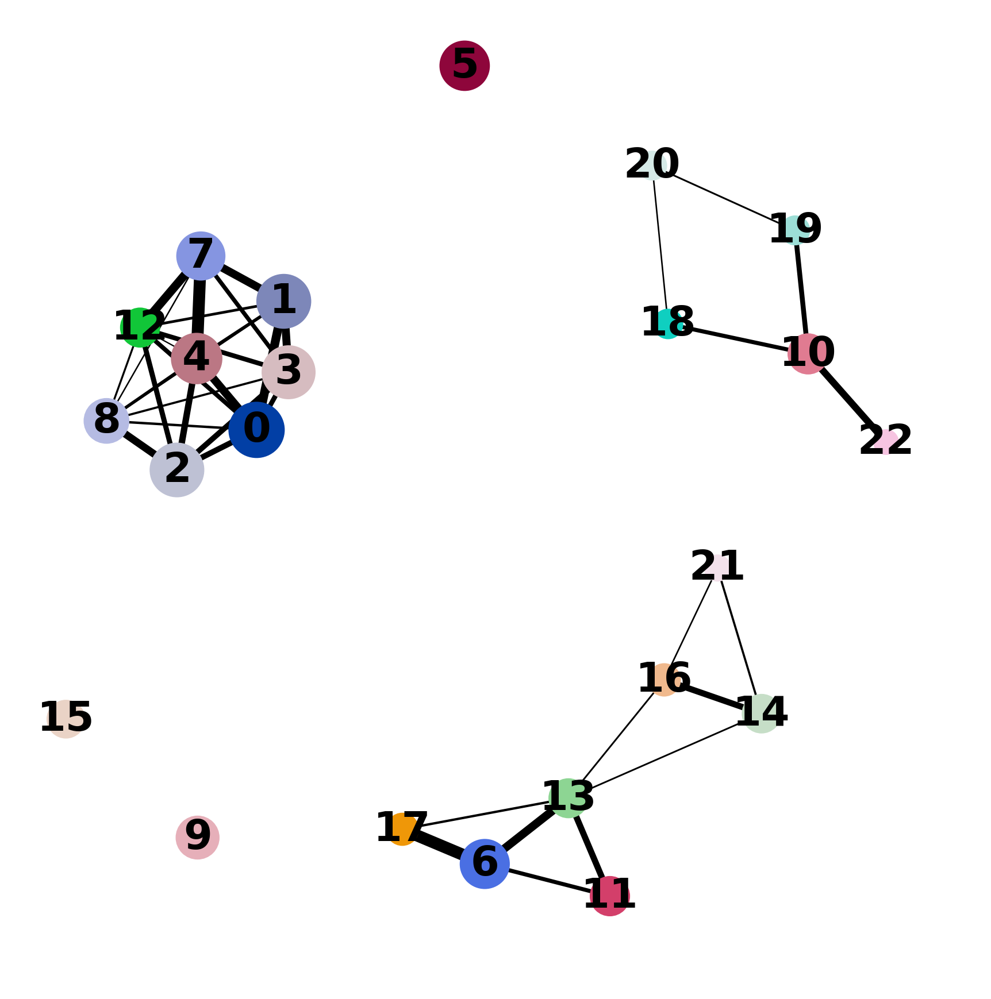

In [46]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.1, title='', edge_width_scale=0.5,
    frameon=False, save=True
)


In [47]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.4, init_pos='paga')

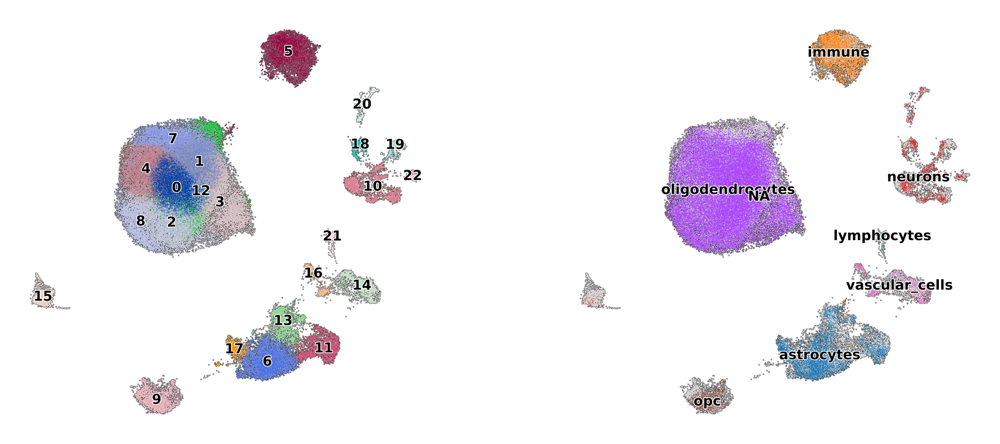

In [48]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(adata, color=['leiden', 'cell_type'],frameon=False, legend_loc='on data', legend_fontoutline=1, legend_fontsize=9, add_outline=True, title=['', ''], save='_leiden_filtered_paga.pdf')


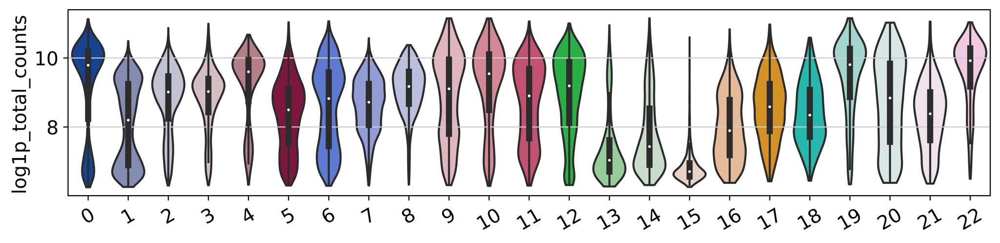

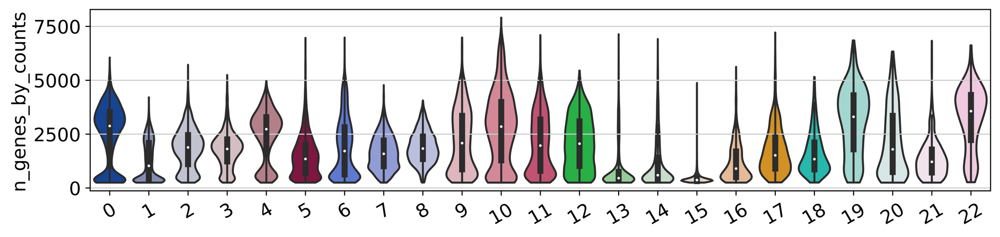

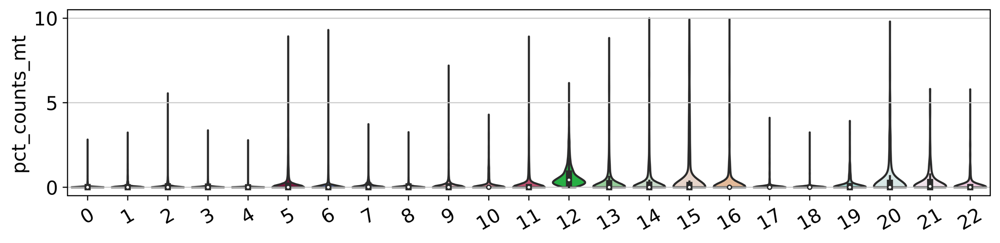

In [50]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'log1p_total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)

categories: 0, 1, 2, etc.
var_group_labels: ODC, OPC, Neuron, etc.


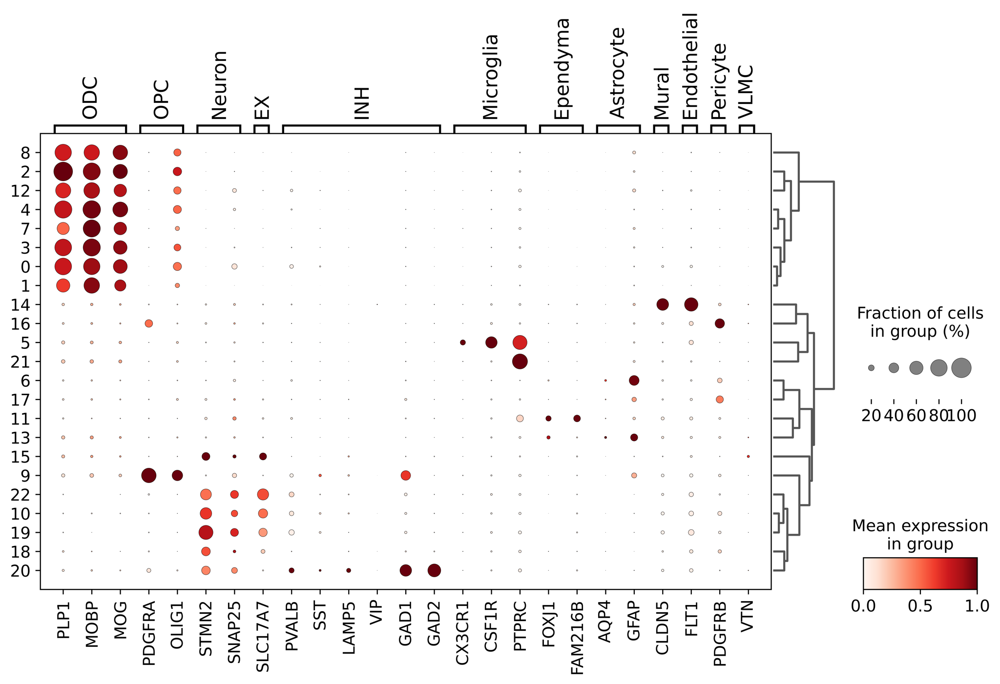

In [49]:
sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var', dendrogram=True, save='filtered_markers.pdf')


## Annotate clusters

In [81]:

adata.obs['orig_cell_type'] = adata.obs['cell_type']
adata.obs = adata.obs.drop('cell_type', axis=1)

# load cluster anno df 
anno_df = pd.read_csv('/dfs3b/swaruplab/shared_lab/cross-disorder/meta_data/MS_Absinta/Absinta_leiden_clusters.csv')

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')

adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()



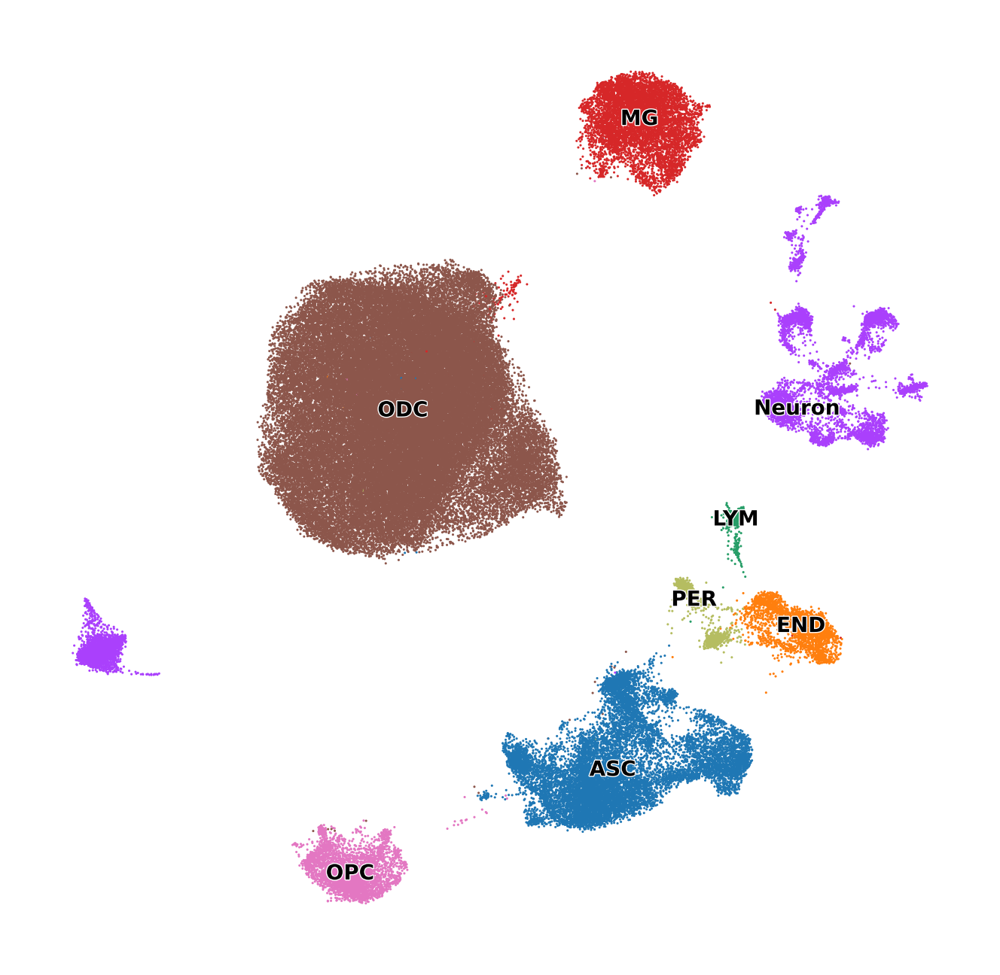

In [91]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(4,4), facecolor='white')
sc.pl.umap(
    adata, color=['cell_type'],
    frameon=False, legend_loc='on data', 
    legend_fontoutline=0.5, legend_fontsize=5, 
    add_outline=False, title=[''], 
    save='_annotated.pdf'
)


## Save processed dataset

In [6]:
# write obs table 
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]
adata.obs.to_csv('{}/Absinta_2021_processed_obs.csv'.format(data_dir))

# write var table:
adata.var.to_csv('{}/Absinta_2021_processed_var.csv'.format(data_dir))


In [124]:
# write anndata:
adata.write_h5ad('{}/Absinta_2021_processed.h5ad'.format(data_dir))

In [4]:
# save the sparse matrix for Seurat:
X = adata.layers['counts']
X = scipy.sparse.csr_matrix.transpose(X)
io.mmwrite('{}/Absinta_2021_counts.mtx'.format(data_dir), X)

In [5]:
# save the Harmony Matrix for Seurat:
pd.DataFrame(adata.obsm['X_pca_harmony']).to_csv('{}/Absinta_2021_processed_harmony.csv'.format(data_dir))


In [3]:
adata = sc.read_h5ad('{}/Absinta_2021_processed.h5ad'.format(data_dir))

## Plot relevant categorical variables

In [93]:
adata.obs.columns

Index(['n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study',
       'orig_barcode', 'batch', 'barcode', 'nbb_num', 'tissue_sample', 'sex',
       'age', 'diagnosis', 'years_disease', 'treatment', 'pmi_hours',
       'Sample_barcode', 'seurat_cluster', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden',
       'orig_cell_type', 'cell_type'],
      dtype='object')

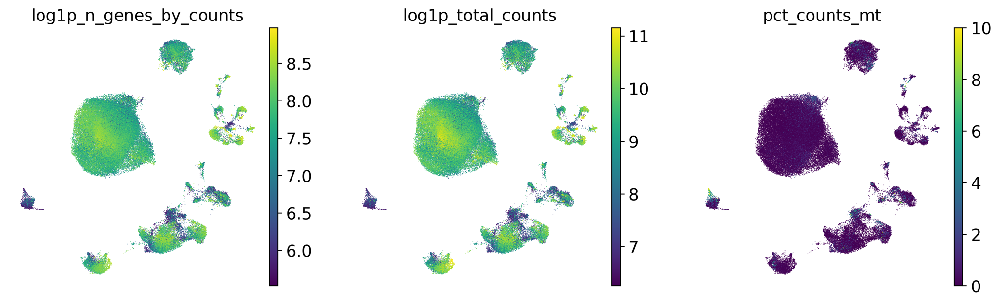

In [102]:
## plot QC vars
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(4,4), facecolor='white')
sc.pl.umap(
    adata, color=['log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_mt'],
    ncols=3,
    frameon=False, 
    add_outline=False, 
    save='_qc.pdf'
)


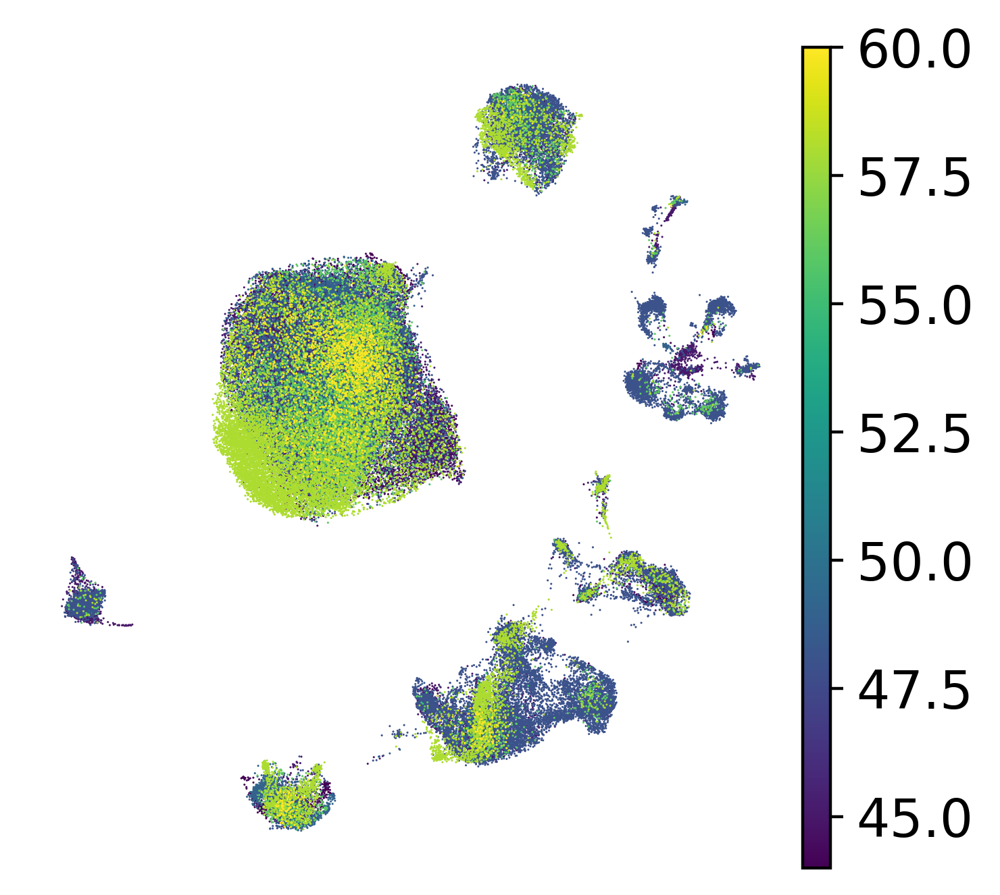

In [106]:
## Age
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(4,4), facecolor='white')
sc.pl.umap(
    adata, color=['age'],
    ncols=3,
    frameon=False, title = '',
    add_outline=False, 
    save='_age.pdf'
)


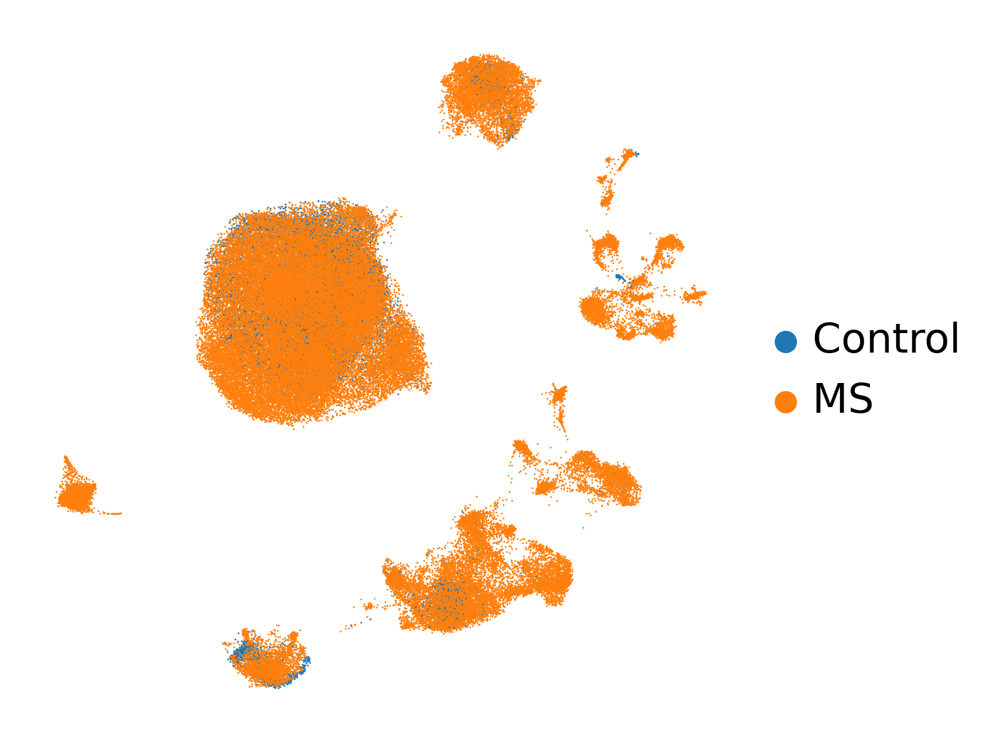

In [98]:
# MS Diagnosis
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(4,4), facecolor='white')
sc.pl.umap(
    adata, color=['diagnosis'],
    frameon=False, 
    add_outline=False, title=[''], 
    save='_diagnosis.pdf'
)


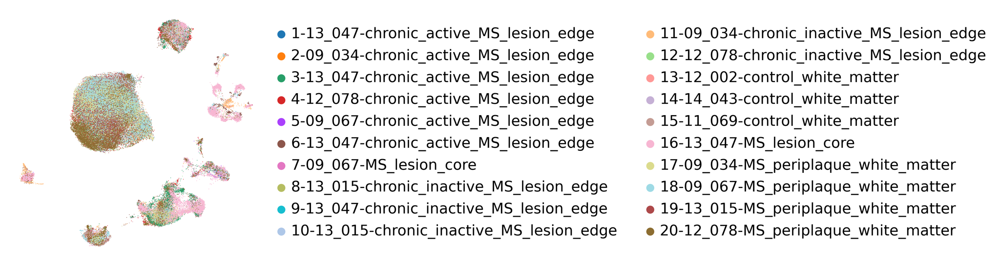

In [90]:
# Samples
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(4,4), facecolor='white')
sc.pl.umap(
    adata, color=['Sample'],
    frameon=False, 
    add_outline=False, title=[''], 
    save='_samples.pdf'
)


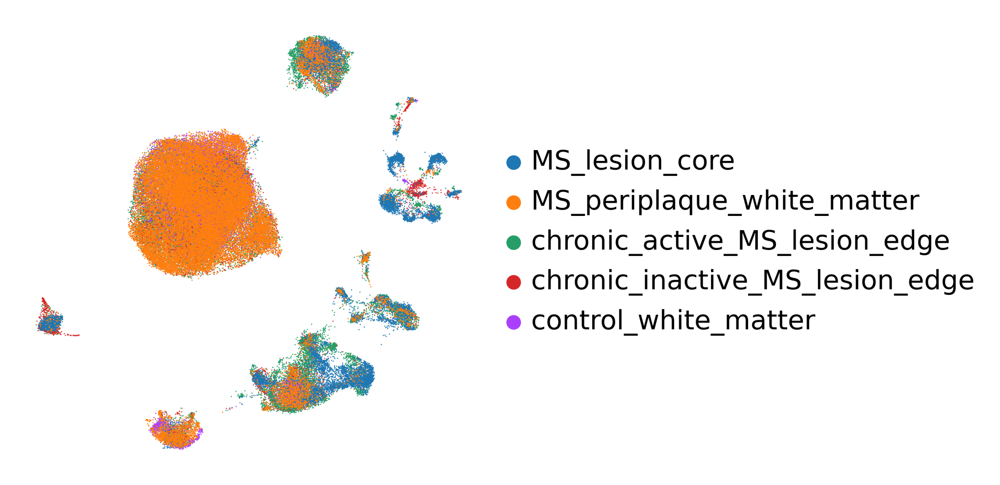

In [94]:
# tissue sample
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(4,4), facecolor='white')
sc.pl.umap(
    adata, color=['tissue_sample'],
    frameon=False, 
    add_outline=False, title=[''], 
    save='_tissue_samples.pdf'
)


In [103]:
# density of diagnosis:
sc.tl.embedding_density(adata, basis='umap', groupby='diagnosis')


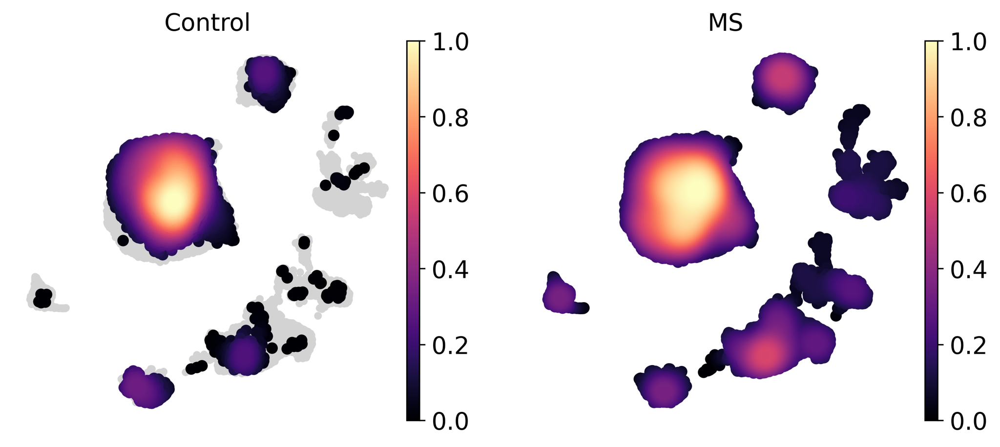

In [104]:
sc.pl.embedding_density(
    adata, 
    basis='umap', 
    key='umap_density_diagnosis',
    ncols=3, color_map = 'magma',
    frameon = False,
    save = True
)
